#### The dataset chosen for analysis is AirBnb's housing information. This includes prices of the AirBnb properties  alongwith a series of variables: 
##### Property related variables such as property type, number of bedrooms, baths, amenities etc, 
##### Location based parameters such as latitude, longitude, neighbourhood, zipcode etc
##### Reviews, review ratings, website etc

#### We have chosen to analyze the data for New York City and the below notebook analyzes the impact of location based parameters on AirBnb properties

#### The objective of the analysis will be to understand the current property landscape in NYC and analyze the best property investment with highest returns, based on location parameters

In [93]:
from pandas import Series, DataFrame
import pandas as pd
%pylab inline

Populating the interactive namespace from numpy and matplotlib


C:\Users\nehaa\Anaconda2\lib\site-packages\IPython\core\magics\pylab.py:161: UserWarning: pylab import has clobbered these variables: ['var']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


#### Create a filtered data set for NYC

In [94]:
airbnb=pd.read_csv('train.csv')
airbnb.head()
airbnb.describe()
airbnb.columns.values

array(['id', 'log_price', 'property_type', 'room_type', 'amenities',
       'accommodates', 'bathrooms', 'bed_type', 'cancellation_policy',
       'cleaning_fee', 'city', 'description', 'first_review',
       'host_has_profile_pic', 'host_identity_verified',
       'host_response_rate', 'host_since', 'instant_bookable',
       'last_review', 'latitude', 'longitude', 'name', 'neighbourhood',
       'number_of_reviews', 'review_scores_rating', 'thumbnail_url',
       'zipcode', 'bedrooms', 'beds'], dtype=object)

In [95]:
airbnb['city'].value_counts()

NYC        32349
LA         22453
SF          6434
DC          5688
Chicago     3719
Boston      3468
Name: city, dtype: int64

In [96]:
airbnb_NYC=airbnb[airbnb['city']=='NYC']
len(airbnb_NYC)

32349

In [97]:
airbnb_NYC=airbnb_NYC.dropna()
len(airbnb_NYC)

17856

In [98]:
airbnb_NYC.head()
NYC_loc=airbnb_NYC[['log_price','latitude','longitude','name','neighbourhood','zipcode']]
NYC_loc.head()
NYC_loc.dtypes

log_price        float64
latitude         float64
longitude        float64
name              object
neighbourhood     object
zipcode           object
dtype: object

#### What are the prices of properties in NYC?

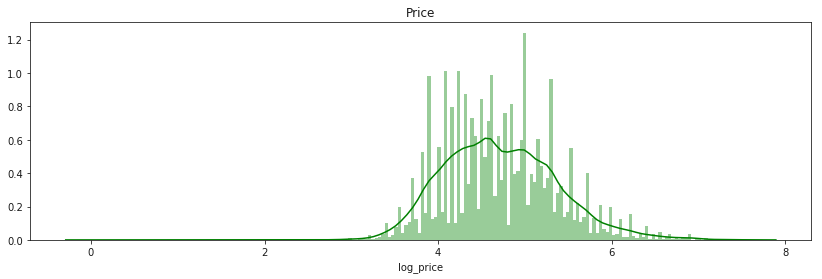

In [99]:
import numpy as np
import seaborn as sns

plt.figure(figsize = (14,4))
plt.title('Price')
sns.set_color_codes("pastel")
sns.distplot(NYC_loc['log_price'],kde=True,bins=200, color="green")
plt.show()

#### The distribution shows that most prices(log_price) are within the (4,6) range.

####  Is there a relationship between location parameters and price?

In [100]:
var = ['latitude','longitude','log_price']
corr = NYC_loc[var].corr()
corr

,latitude,longitude,log_price
latitude,1.000000,0.078762,0.059930
longitude,0.078762,1.000000,-0.364168
log_price,0.059930,-0.364168,1.000000


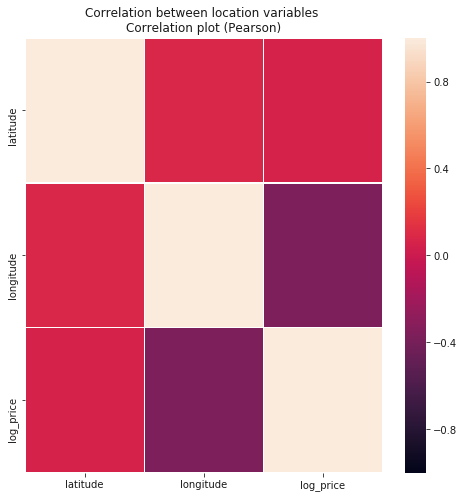

In [101]:
plt.figure(figsize = (8,8))
plt.title('Correlation between location variables \nCorrelation plot (Pearson)')
sns.heatmap(corr,xticklabels=corr.columns,yticklabels=corr.columns,linewidths=.1,vmin=-1, vmax=1)
plt.show()

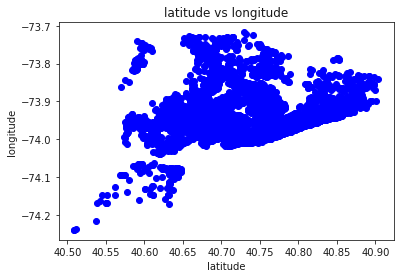

In [102]:
plot(NYC_loc['latitude'], NYC_loc['longitude'], marker='o', color='blue', linestyle='None')
xlabel('latitude')
ylabel('longitude')
title('latitude vs longitude')
show()

In [103]:
#Considering only longitude here as name, neighbourhood are object tyoe fields. Zipciode, latitude and longitude
#are related. Hence, using one of the variables to avoid multicollinearity
from sklearn import preprocessing
import statsmodels.api as sm
NYC_loc.head()
X = NYC_loc[['longitude']]
y = NYC_loc["log_price"]
model = sm.OLS(y, X).fit()
predictions = model.predict(X) 
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.982
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                 9.489e+05
Date:                Sun, 04 Aug 2019   Prob (F-statistic):               0.00
Time:                        17:21:24   Log-Likelihood:                -17573.
No. Observations:               17856   AIC:                         3.515e+04
Df Residuals:                   17855   BIC:                         3.516e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
longitude     -0.0638   6.55e-05   -974.092      0.000      -0.064      -0.064
==============================================================================
Omnibus:                      516.748   Durbin-Watson:                   1.974
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              587.618
Skew:                           0.392   Prob(JB):                    2.51e-128
Kurtosis:                       3.420   Cond. No.                         1.00
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### The high t statistic shows that location does have a statistically significant relationship with price. This means that location of the property is an important parameter that impacts price.

#### Now that we have established a relationship between location and price, let's analyze this further.

#### Let's start with understanding where all the properties are currently located. Out of this, we are mainly interested in neighbourhoods which have the most number of properties (showcases higher demand) and properties which have the highest price. As a new investor, if I could get a combination of best price in the best location, it would work great

In [104]:
import folium
folium_map = folium.Map(location=[40.738, -73.98],
                        zoom_start=13,
                        tiles="OpenStreetMap")
marker = folium.CircleMarker(location=[40.738, -73.98])
marker.add_to(folium_map)
folium_map.save("my_map.html")
folium_map

In [8]:
import folium
import pandas as pd

m = folium.Map(location=[40.738, -73.98], tiles="OpenStreetMap", zoom_start=10)
 
for i in range(0,len(NYC_loc)):
   folium.Circle(
      location=[NYC_loc.iloc[i]['latitude'], NYC_loc.iloc[i]['longitude']],
      radius=NYC_loc.iloc[i]['log_price'],
      color='crimson',
      fill=True,
      fill_color='crimson'
   ).add_to(m)
 
# Save it as html
m.save('markers_NYC.html')

In [9]:
display(m)

#### Top 10 neighbourhoods in NYC for AirBnb properties

In [105]:
NYC_loc.head()
top_neigh=NYC_loc['neighbourhood'].value_counts()[1:10].index.values
NYC_topneigh=NYC_loc[NYC_loc['neighbourhood'].isin(NYC_loc['neighbourhood'].value_counts()[1:10].index.values)]
NYC_topneigh_map=NYC_topneigh.groupby(['neighbourhood'])[['latitude','longitude']].agg('mean')
NYC_topneigh_map['neighbourhood']=NYC_topneigh_map.index.values
NYC_topneigh_map


,latitude,longitude,neighbourhood
neighbourhood,,,
Astoria,40.763987,-73.922009,Astoria
Bedford-Stuyvesant,40.686793,-73.938118,Bedford-Stuyvesant
Bushwick,40.696391,-73.920314,Bushwick
Crown Heights,40.672487,-73.945573,Crown Heights
East Harlem,40.795273,-73.942731,East Harlem
Harlem,40.810951,-73.947790,Harlem
Hell's Kitchen,40.762269,-73.990890,Hell's Kitchen
Upper East Side,40.773287,-73.954337,Upper East Side
Upper West Side,40.788421,-73.973487,Upper West Side


In [106]:
m = folium.Map(location=[40.738, -73.98], tiles="OpenStreetMap", zoom_start=10)
for i in range(0,len(NYC_topneigh_map)):
    folium.Marker([NYC_topneigh_map.iloc[i]['latitude'], NYC_topneigh_map.iloc[i]['longitude']], popup=NYC_topneigh_map.iloc[i]['neighbourhood']).add_to(m)
 
m.save('Top 10 neighbourhoods NYC.html')
display(m)


#### Top 10 most expensive AirBnb properties in NYC

In [107]:
NYC_loc.head()
NYC_topprice=NYC_loc.sort_values(by='log_price',ascending=False)[['log_price','latitude','longitude','name','neighbourhood','zipcode']][0:10]
NYC_topprice['price']=e**NYC_topprice['log_price']
NYC_topprice


,log_price,latitude,longitude,name,neighbourhood,zipcode,price
55453,7.600402,40.733003,-73.994126,Royal Manor!!!,Greenwich Village,10003,1999.000001
2386,7.467371,40.732373,-74.002833,Full-service 4BD West Village townhouse *w/POOL*,West Village,10014,1750.000000
27111,7.456455,40.742339,-74.000320,Ultra-Modern 6-bedroom House (Great for Groups),Chelsea,10011,1731.000000
56850,7.408531,40.738811,-73.994391,Stunning 2600ft full floor LOFT,Union Square,10011,1650.000000
9970,7.313220,40.749363,-73.991594,"Private Movie, Party Space",Chelsea,10119,1500.000000
56282,7.313220,40.768427,-73.982123,Columbus Circle Apartment with Central Park View,Upper West Side,10023,1500.000000
28722,7.313220,40.727919,-73.992054,Christmas Village panorama Designer loft,Noho,10003,1500.000000
62982,7.313220,40.713214,-73.990985,Amazing panoramic view loft,Chinatown,10002,1500.000000
11941,7.286192,40.725604,-73.994868,NOHO LUXURY LOFT,Noho,10012,1460.000000
22909,7.240650,40.678807,-73.993788,"Beautiful eco triplex w/green roof, 30 day boo...",Carroll Gardens,11231,1395.000000


In [108]:
m = folium.Map(location=[40.738, -73.98], tiles="OpenStreetMap", zoom_start=12)
 
for i in range(0,len(NYC_topprice)):
      folium.Circle(
      location=[NYC_topprice.iloc[i]['latitude'], NYC_topprice.iloc[i]['longitude']],
      radius=NYC_topprice.iloc[i]['price']*0.2,
       popup=NYC_topprice.iloc[i]['name']+" in "+NYC_topprice.iloc[i]['neighbourhood']+" in "+NYC_topprice.iloc[i]['zipcode'],
      color='crimson',
      fill=True,
      fill_color='crimson'
   ).add_to(m)

m.save('Most expensive properties NYC.html')
display(m)

#### Now we have the top neighbourhoods and the top priced properties. Let's find out the best neighbourhood which has the best priced apartments

In [109]:

NYC_topneigh['neighbourhood'].unique()
NYC_topneighprice=NYC_topneigh.copy()

In [110]:
NYC_topneighprice=NYC_topneigh[NYC_topneigh['neighbourhood'].isin(NYC_topprice['neighbourhood'])]
NYC_topneighprice['price']=e**NYC_topneighprice['log_price']
NYC_topneighprice['price']
price_rank=NYC_topneighprice['price'].rank(ascending=False)
NYC_topneighprice['price_group']=pd.qcut(price_rank,3,duplicates='drop')
NYC_topneighprice

C:\Users\nehaa\Anaconda2\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Users\nehaa\Anaconda2\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


,log_price,latitude,longitude,name,neighbourhood,zipcode,price,price_group
118,4.653960,40.800062,-73.964803,1 Bedroom Apartment on the Upper West Side,Upper West Side,10025,105.0,"(441.5, 663.0]"
145,4.605170,40.787634,-73.972040,1 bd in 2bd steps 2 Lincoln Center,Upper West Side,10024,100.0,"(441.5, 663.0]"
154,6.527958,40.781495,-73.978736,Stunning New York Brownstone,Upper West Side,10023,684.0,"(0.999, 222.667]"
237,5.783825,40.777878,-73.977083,Central Park Bliss,Upper West Side,10023,325.0,"(0.999, 222.667]"
330,4.442651,40.800237,-73.968265,Quaint & Quiet Room - UWS Apt (105/Broadway),Upper West Side,10025,85.0,"(441.5, 663.0]"
344,4.744932,40.775794,-73.988637,Lincoln Center luxury Studio,Upper West Side,10023,115.0,"(222.667, 441.5]"
570,4.382027,40.793959,-73.970589,NYC Charming Upper West Side Apt.,Upper West Side,10025,80.0,"(441.5, 663.0]"
572,5.370638,40.777337,-73.980687,Pure Luxury on the Upper West Side - Elevator ...,Upper West Side,10023,215.0,"(0.999, 222.667]"
711,4.605170,40.782778,-73.977673,A private room in a big UWS Apt,Upper West Side,10024,100.0,"(441.5, 663.0]"
850,4.605170,40.801301,-73.966692,Cozy Bedroom in 3BR1B apt in Upper West Side,Upper West Side,10025,100.0,"(441.5, 663.0]"


#### This tells me if I am looking at the best price-location combination, Upper West Side is the best option. We have also bifurcated prices in this area into low,medium and high price groups.

#### Now that we know which location to invest in, it would be great to understand the most commonly used words in descriptions or names. Adding that in the property name, description, digital footprint could work to our advantage

In [111]:
name=' '.join(NYC_loc['name'].values)
import re
name1= re.findall('[a-zA-Z]{3,}',name)
from collections import Counter 
Counter = Counter(name1) 
most_occur = Counter.most_common(50)

In [113]:
words=[]
for i in range(0,len(most_occur)):
    list=['in','with','and','to','of','a','or','Room','room','the','near','Side','apartment','Apartment','apt','for','Apt','from']
    if (most_occur[i][0] not in list):
        words.append(most_occur[i][0])
word_cloud=' '.join(new)

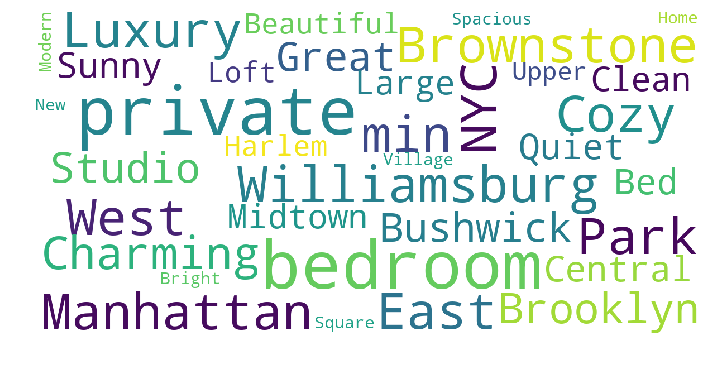

In [114]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
stopwords = set(STOPWORDS)

def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=200,
        max_font_size=40, 
        scale=3,
        random_state=1 # chosen at random by flipping a coin; it was heads
    ).generate(str(data))

    fig = plt.figure(1, figsize=(12, 12))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()
show_wordcloud(word_cloud)

#### Now I know the most common keywords to be used in a new property investment. If I were to look at a new investment in property and analyzing location, I now know that Upper West Side in NYC is my best bet and words like 'private','luxury','beautiful' etc are my keywords, I should leverage